#Training

In [ ]:
#@title 🤗 AutoTrain DreamBooth
#@markdown In order to use this colab
#@markdown - upload images to a folder named `images/`
#@markdown - choose a project name if you wish
#@markdown - change model if you wish, you can also select sd2/2.1 or sd1.5
#@markdown - update prompt and remember it. choose keywords that don't usually appear in dictionaries
#@markdown - add huggingface information (token and repo_id) if you wish to push trained model to huggingface hub
#@markdown - update hyperparameters if you wish
#@markdown - click `Runtime > Run all` or run each cell individually
#@markdown - report issues / feature requests here: https://github.com/huggingface/autotrain-advanced/issues

import os
!pip install -U autotrain-advanced > install_logs.txt

In [ ]:
#@markdown ---
#@markdown #### Project Config
project_name = 'my_dreambooth_project' # @param {type:"string"}
model_name = 'stabilityai/stable-diffusion-2-1' # @param ["stabilityai/stable-diffusion-xl-base-1.0", "runwayml/stable-diffusion-v1-5", "stabilityai/stable-diffusion-2-1", "stabilityai/stable-diffusion-2-1-base"]
prompt = 'photo of a sks dog' # @param {type: "string"}

#@markdown ---
#@markdown #### Push to Hub?
#@markdown Use these only if you want to push your trained model to a private repo in your Hugging Face Account
#@markdown If you dont use these, the model will be saved in Google Colab and you are required to download it manually.
#@markdown Please enter your Hugging Face write token. The trained model will be saved to your Hugging Face account.
#@markdown You can find your token here: https://huggingface.co/settings/tokens
push_to_hub = False # @param ["False", "True"] {type:"raw"}
hf_token = "hf_XXX" #@param {type:"string"}
repo_id = "username/repo_name" #@param {type:"string"}

#@markdown ---
#@markdown #### Hyperparameters
learning_rate = 1e-4 # @param {type:"number"}
num_steps = 200 #@param {type:"number"}
batch_size = 1 # @param {type:"slider", min:1, max:32, step:1}
gradient_accumulation = 1 # @param {type:"slider", min:1, max:32, step:1}
resolution = 128 # @param {type:"slider", min:128, max:1024, step:128}
use_8bit_adam = False # @param ["False", "True"] {type:"raw"}
use_xformers = False # @param ["False", "True"] {type:"raw"}
use_fp16 = True # @param ["False", "True"] {type:"raw"}
train_text_encoder = False # @param ["False", "True"] {type:"raw"}
gradient_checkpointing = True # @param ["False", "True"] {type:"raw"}

os.environ["PROJECT_NAME"] = project_name
os.environ["MODEL_NAME"] = model_name
os.environ["PROMPT"] = prompt
os.environ["PUSH_TO_HUB"] = str(push_to_hub)
os.environ["HF_TOKEN"] = hf_token
os.environ["REPO_ID"] = repo_id
os.environ["LEARNING_RATE"] = str(learning_rate)
os.environ["NUM_STEPS"] = str(num_steps)
os.environ["BATCH_SIZE"] = str(batch_size)
os.environ["GRADIENT_ACCUMULATION"] = str(gradient_accumulation)
os.environ["RESOLUTION"] = str(resolution)
os.environ["USE_8BIT_ADAM"] = str(use_8bit_adam)
os.environ["USE_XFORMERS"] = str(use_xformers)
os.environ["USE_FP16"] = str(use_fp16)
os.environ["TRAIN_TEXT_ENCODER"] = str(train_text_encoder)
os.environ["GRADIENT_CHECKPOINTING"] = str(gradient_checkpointing)

In [ ]:
# !mv /content/*.png '/content/images/'

In [ ]:
!autotrain dreambooth \
--model ${MODEL_NAME} \
--project-name ${PROJECT_NAME} \
--image-path images/ \
--prompt "${PROMPT}" \
--resolution ${RESOLUTION} \
--batch-size ${BATCH_SIZE} \
--num-steps ${NUM_STEPS} \
--gradient-accumulation ${GRADIENT_ACCUMULATION} \
--lr ${LEARNING_RATE} \
$( [[ "$USE_FP16" == "True" ]] && echo "--fp16" ) \
$( [[ "$USE_XFORMERS" == "True" ]] && echo "--xformers" ) \
$( [[ "$TRAIN_TEXT_ENCODER" == "True" ]] && echo "--train-text-encoder" ) \
$( [[ "$USE_8BIT_ADAM" == "True" ]] && echo "--use-8bit-adam" ) \
$( [[ "$GRADIENT_CHECKPOINTING" == "True" ]] && echo "--gradient-checkpointing" ) \
$( [[ "$PUSH_TO_HUB" == "True" ]] && echo "--push-to-hub --token ${HF_TOKEN} --repo-id ${REPO_ID}" )

> INFO    Namespace(version=False, model='stabilityai/stable-diffusion-2-1', revision=None, tokenizer=None, image_path='images/', class_image_path=None, prompt='photo of a sks dog', class_prompt=None, num_class_images=100, class_labels_conditioning=None, prior_preservation=None, prior_loss_weight=1.0, project_name='my_dreambooth_project', seed=42, resolution=128, center_crop=None, train_text_encoder=None, batch_size=1, sample_batch_size=4, epochs=1, num_steps=200, checkpointing_steps=100000, resume_from_checkpoint=None, gradient_accumulation=1, gradient_checkpointing=None, lr=0.0001, scale_lr=None, scheduler='constant', warmup_steps=0, num_cycles=1, lr_power=1.0, dataloader_num_workers=0, use_8bit_adam=None, adam_beta1=0.9, adam_beta2=0.999, adam_weight_decay=0.01, adam_epsilon=1e-08, max_grad_norm=1.0, allow_tf32=None, prior_generation_precision=None, local_rank=-1, xformers=None, pre_compute_text_embeddings=None, tokenizer_max_length=None, text_encoder_use_attention_mask=None, rank=4

#Visualizing results

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install diffusers

In [ ]:
# Inference
# this is the inference code that you can use after you have trained your model
# Unhide code below and change prj_path to your repo or local path (e.g. my_dreambooth_project)
#
#
#
from diffusers import DiffusionPipeline  #, StableDiffusionXLImg2ImgPipeline
from torch import float16

prj_path = "/content/drive/MyDrive/my_dreambooth_project"
model = "stabilityai/stable-diffusion-xl-base-1.0"
pipe = DiffusionPipeline.from_pretrained(
    model,
    torch_dtype= float16,
)
pipe.to("cuda")
pipe.load_lora_weights(prj_path, weight_name="pytorch_lora_weights.safetensors")

# refiner.to("cuda")


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


In [ ]:
import torch
seed = 42
generator = torch.Generator("cuda").manual_seed(seed)

In [ ]:
all_images = []
prompts = ["photo of Ghfran, cute smile, full body, with wings like an angel, high quality",
           "photo of Ghfran in a forest, sitting beside the lake",
           "photo of Ghfran, in street, cyberpunk, like a spy, standing on a car, purple sky",
           "photo of Ghfran on a skyscraper roof, firework, smiling to the camera",
           "photo of Ghfran in samurai costum in china, realism",
           "photo of Ghfran in a long wedding dress",
           "photo of Ghfran like a CEO, in a fancy office, dressed in black"]

for i, prompt in enumerate(prompts):
    image = pipe(prompt=prompt, generator=generator).images[0]
    # image = image.to('cpu')
    print(type(image))
    all_images.append(image)
    print(image)

  0%|          | 0/50 [00:00<?, ?it/s]

<class 'PIL.Image.Image'>
<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7822F262E500>


  0%|          | 0/50 [00:00<?, ?it/s]

<class 'PIL.Image.Image'>
<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7822F267D720>


  0%|          | 0/50 [00:00<?, ?it/s]

<class 'PIL.Image.Image'>
<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7822F262D4E0>


  0%|          | 0/50 [00:00<?, ?it/s]

<class 'PIL.Image.Image'>
<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7822F267EC80>


  0%|          | 0/50 [00:00<?, ?it/s]

<class 'PIL.Image.Image'>
<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7822F267F670>


  0%|          | 0/50 [00:00<?, ?it/s]

<class 'PIL.Image.Image'>
<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7822F267EB30>


  0%|          | 0/50 [00:00<?, ?it/s]

<class 'PIL.Image.Image'>
<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7822F267F4C0>


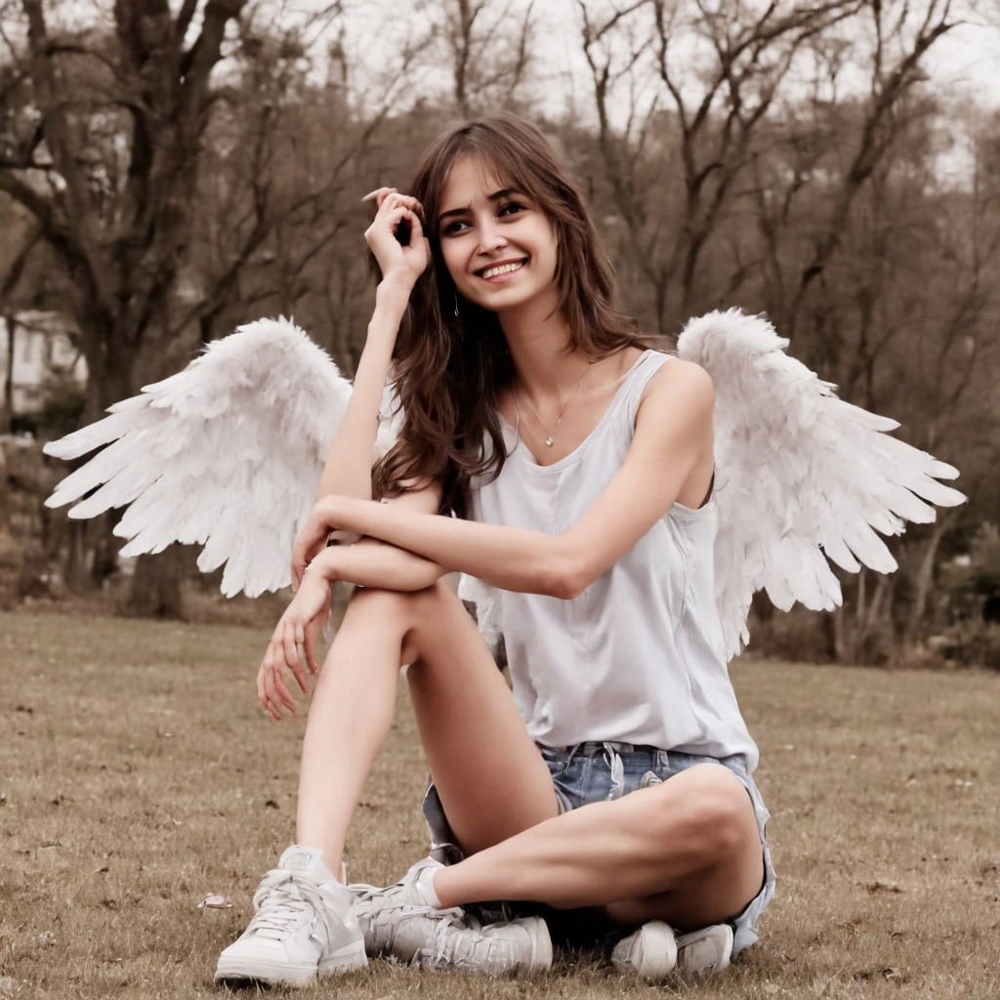

In [ ]:
all_images[0]

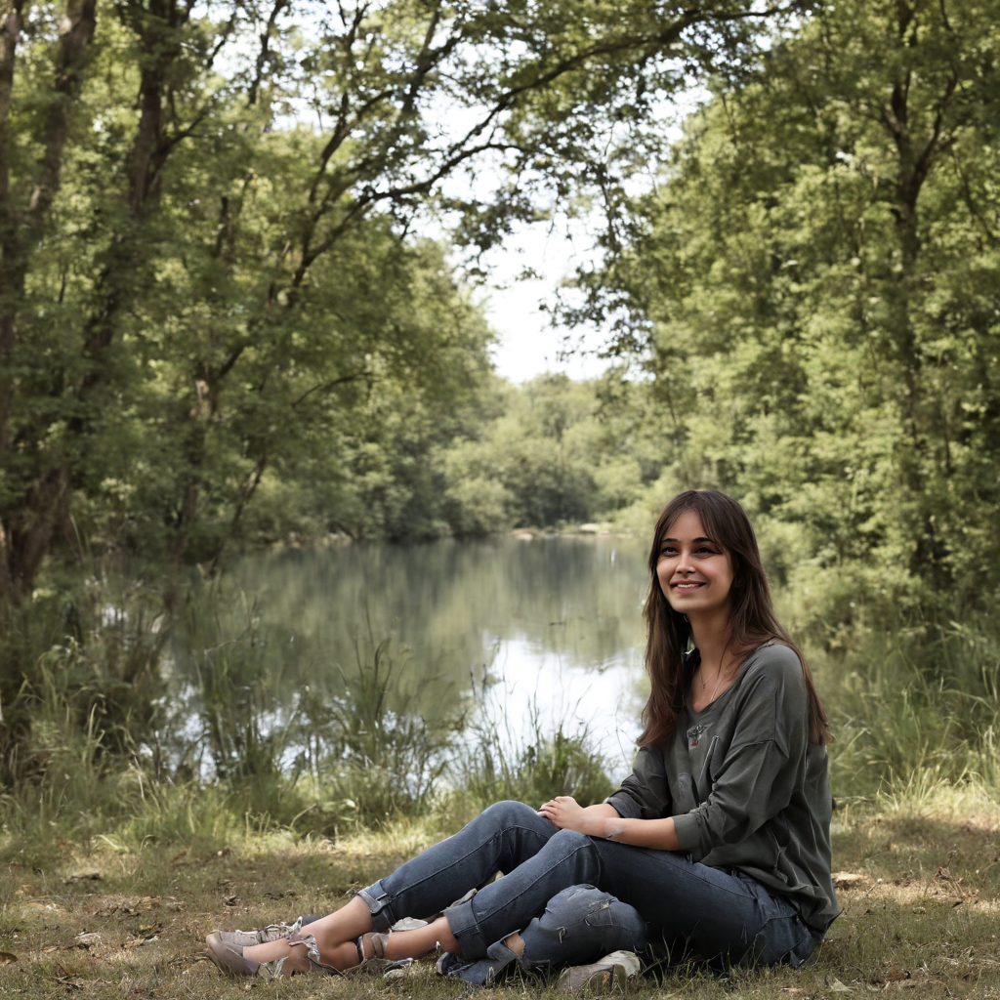

In [ ]:
all_images[1]

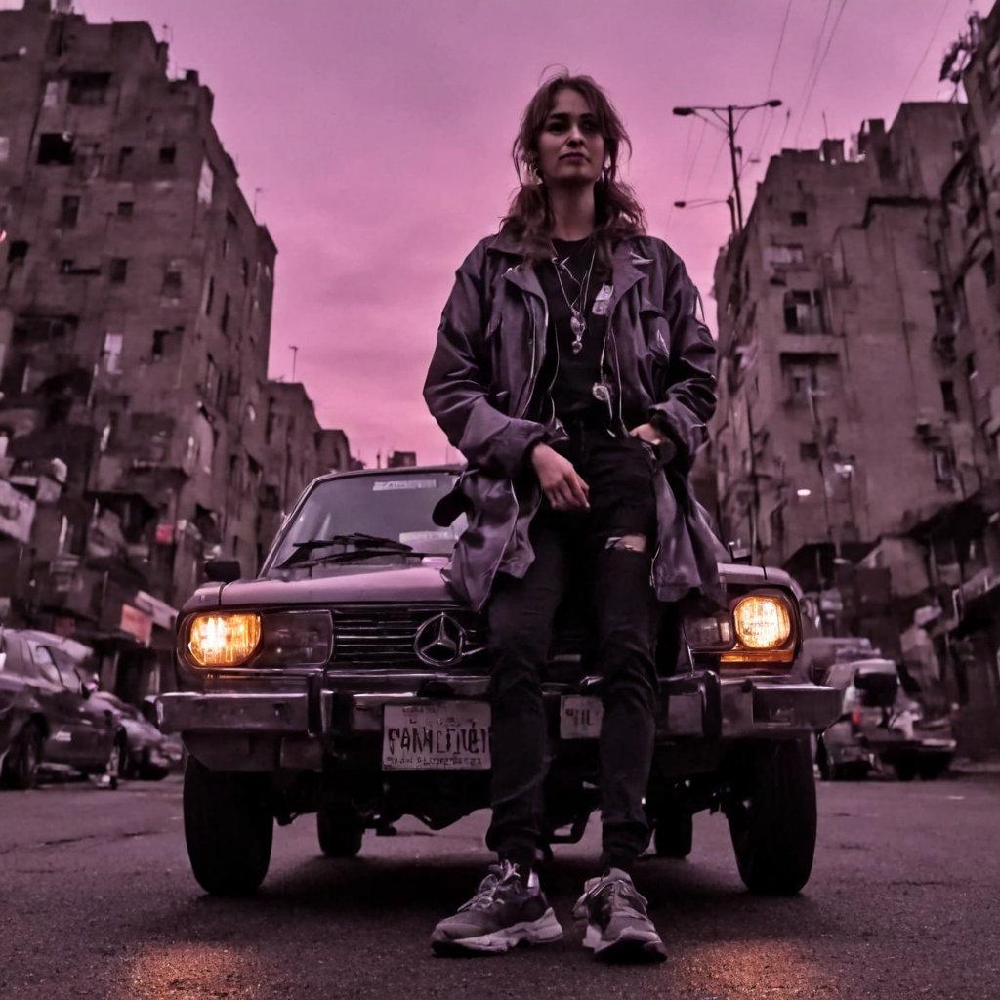

In [ ]:
all_images[2]

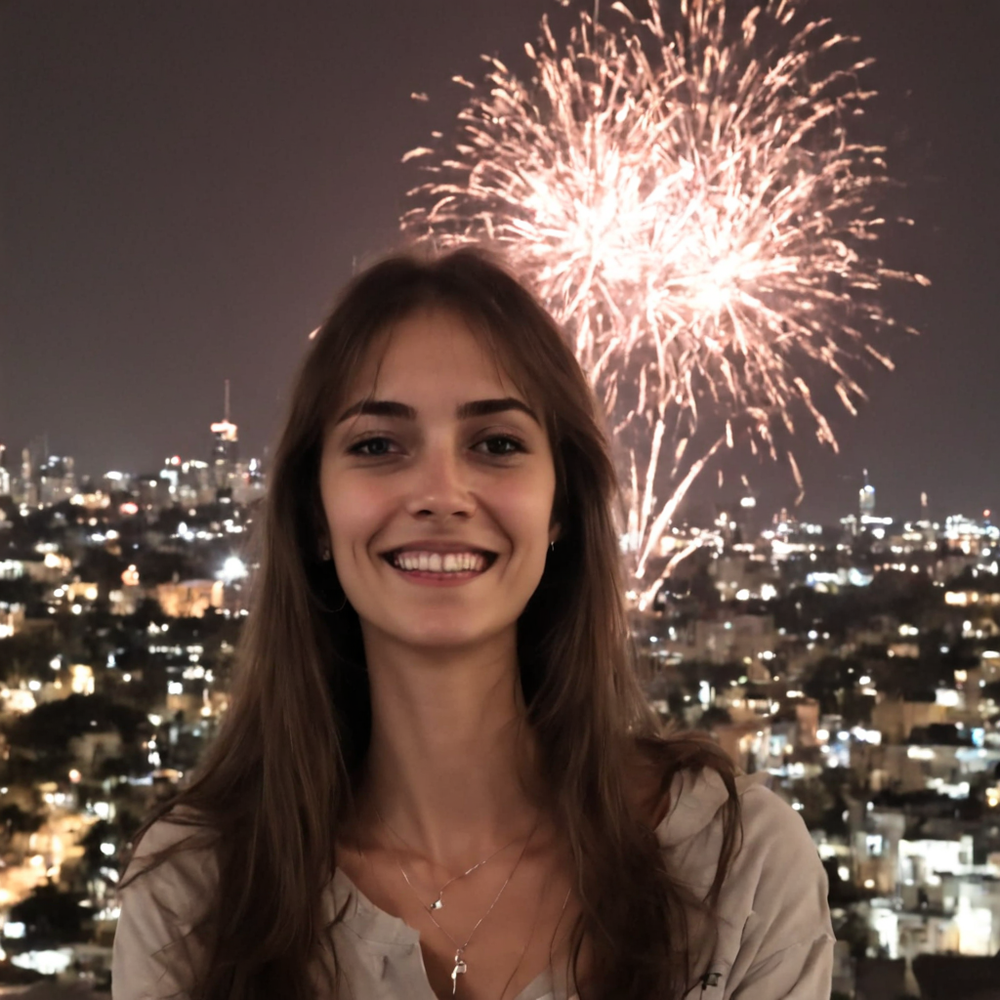

In [ ]:
all_images[3]

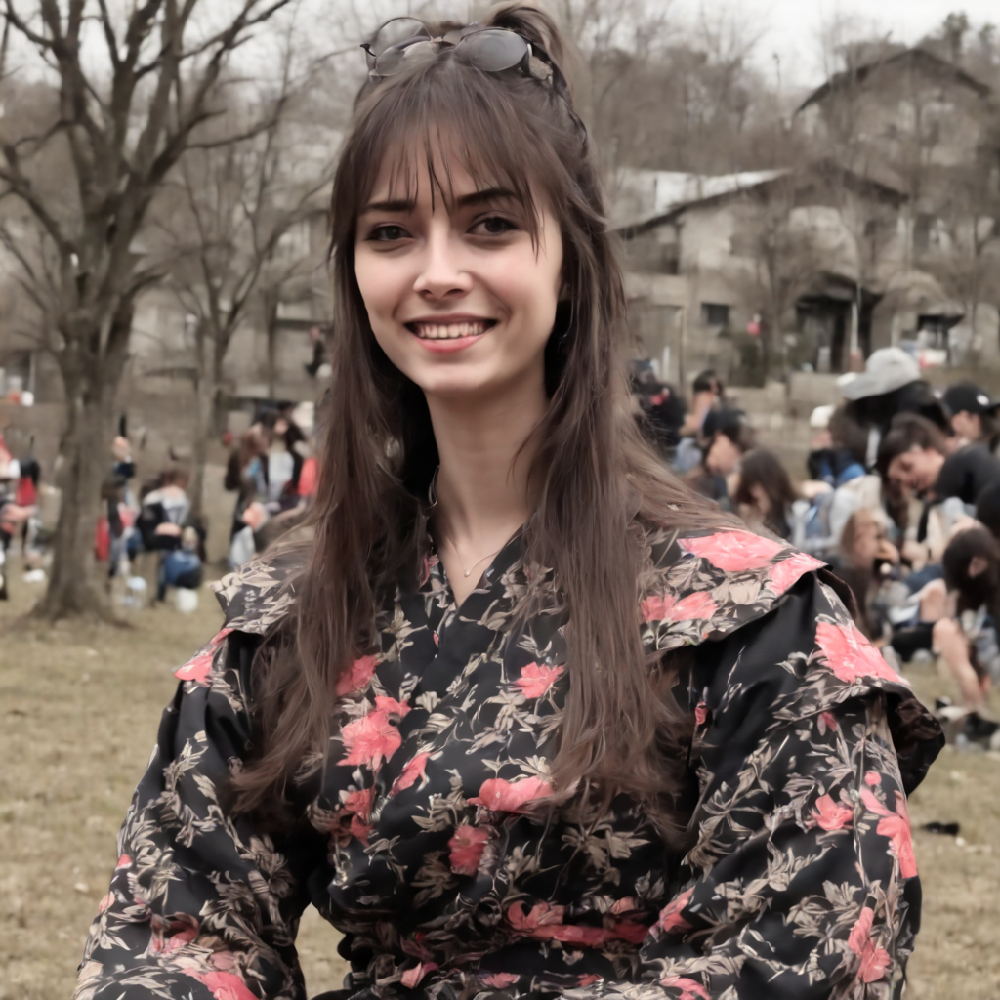

In [ ]:
all_images[4]

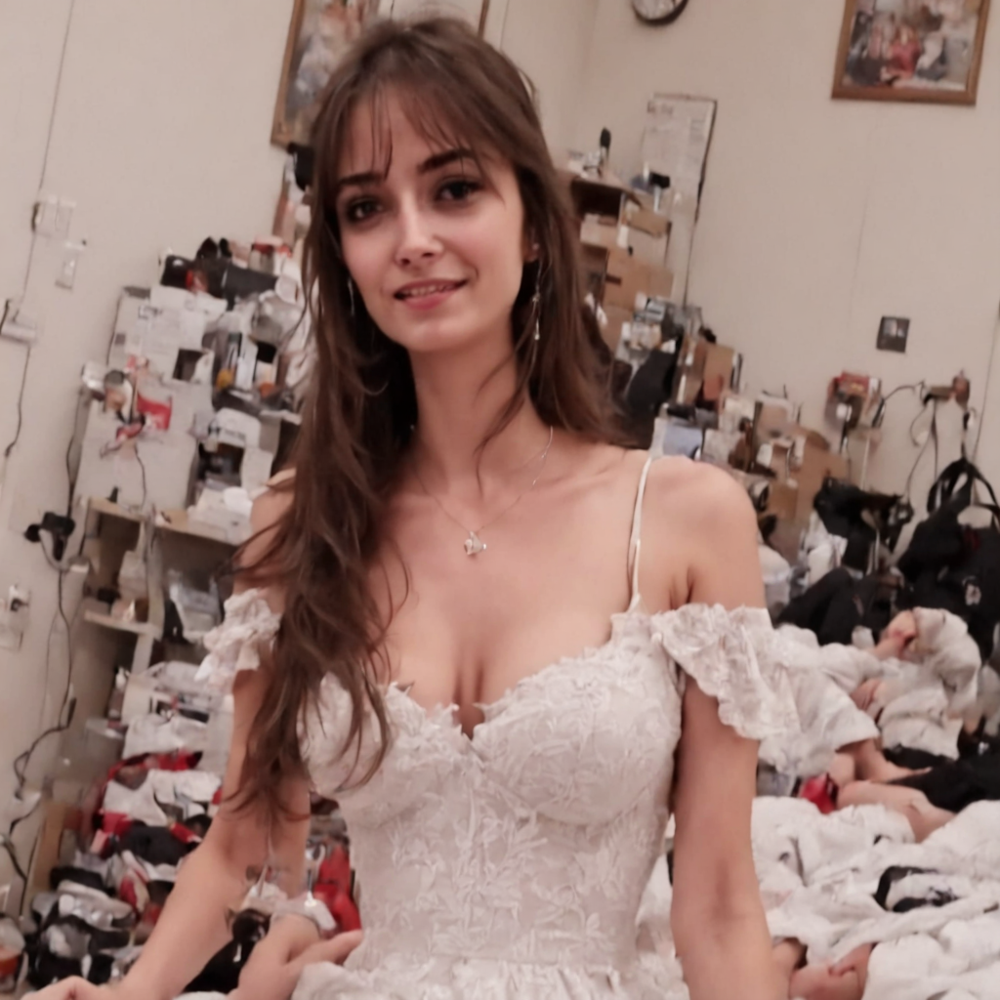

In [ ]:
all_images[5]

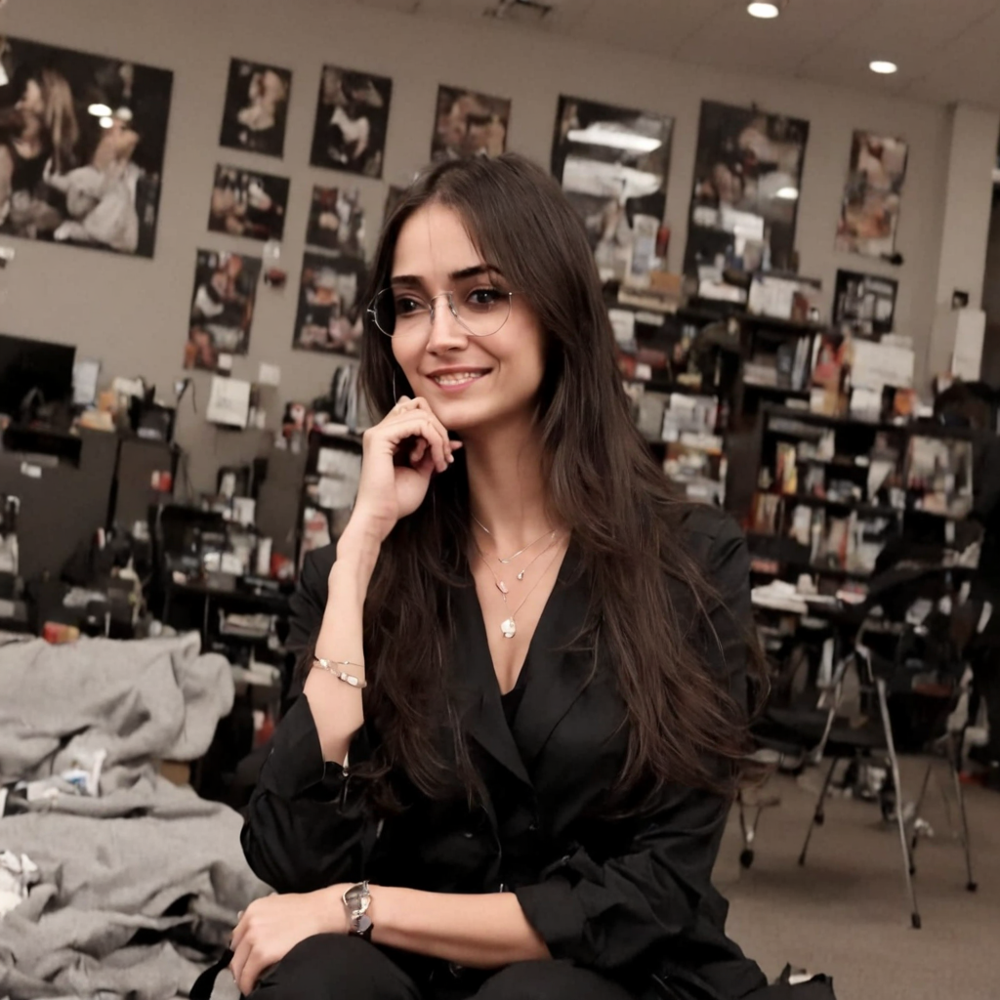

In [ ]:
all_images[6]